# Bayesian Multinomial Logistic Regression
[Multinomial logistic regression](https://en.wikipedia.org/wiki/Multinomial_logistic_regression) is an extension of logistic regression. Logistic regression is used to model problems in which there are exactly two possible discrete outcomes. Multinomial logistic regression is used to model problems in which there are two or more possible discrete outcomes.

In our example, we'll be using the iris dataset. The goal of the iris multiclass problem is to predict the species of a flower given measurements (in centimeters) of sepal length and width and petal length and width. There are three possible species: Iris setosa, Iris versicolor, and Iris virginica.

To start, let's import all the libraries we'll need.

In [1]:
# Import Turing and Distributions.
using Turing, Distributions

# Import RDatasets.
using RDatasets

# Import MCMCChains, Plots, and StatsPlots for visualizations and diagnostics.
using MCMCChains, Plots, StatsPlots

# We need a softmax function, which is provided by NNlin.
using NNlib: softmax

# Set a seed for reproducibility.
using Random
Random.seed!(0);

## Data Cleaning & Set Up

Now we're going to import our dataset. Twenty rows of the dataset are shown below so you can get a good feel for what kind of data we have.

In [2]:
# Import the "iris" dataset.
data = RDatasets.dataset("datasets", "iris");

# Randomly shuffle the rows of the dataset
num_rows = size(data, 1)
data = data[Random.shuffle(1:num_rows), :]

# Show twenty rows
first(data, 20)

,SepalLength,SepalWidth,PetalLength,PetalWidth,Species
,Float64,Float64,Float64,Float64,Categorical…
1,6.9,3.2,5.7,2.3,virginica
2,5.8,2.7,5.1,1.9,virginica
3,6.6,2.9,4.6,1.3,versicolor
4,6.3,2.5,5.0,1.9,virginica
5,5.0,2.0,3.5,1.0,versicolor
6,5.8,4.0,1.2,0.2,setosa
7,6.7,3.1,4.7,1.5,versicolor
8,5.7,2.8,4.5,1.3,versicolor
9,6.3,2.9,5.6,1.8,virginica


In this data set, the outcome `Species` is currently coded as a string. We need to convert the `Species` into 1s and 0s.

We will create three new columns: `Species_setosa`, `Species_versicolor` and `Species_virginica`.

- If a row has `setosa` as the species, then it will have `Species_setosa = 1`, `Species_versicolor = 0`, and `Species_virginica = 0`.
- If a row has `versicolor` as the species, then it will have `Species_setosa = 0`, `Species_versicolor = 1`, and `Species_virginica = 0`.
- If a row has `virginica` as the species, then it will have `Species_setosa = 0`, `Species_versicolor = 0`, and `Species_virginica = 1`.

In [3]:
# Recode the `Species` column
data[!, :Species_setosa] = [r.Species == "setosa" ? 1.0 : 0.0 for r in eachrow(data)]
data[!, :Species_versicolor] = [r.Species == "versicolor" ? 1.0 : 0.0 for r in eachrow(data)]
data[!, :Species_virginica] = [r.Species == "virginica" ? 1.0 : 0.0 for r in eachrow(data)]

# Show twenty rows of the new species columns
first(data[!, [:Species, :Species_setosa, :Species_versicolor, :Species_virginica]], 20)

,Species,Species_setosa,Species_versicolor,Species_virginica
,Categorical…,Float64,Float64,Float64
1,virginica,0.0,0.0,1.0
2,virginica,0.0,0.0,1.0
3,versicolor,0.0,1.0,0.0
4,virginica,0.0,0.0,1.0
5,versicolor,0.0,1.0,0.0
6,setosa,1.0,0.0,0.0
7,versicolor,0.0,1.0,0.0
8,versicolor,0.0,1.0,0.0
9,virginica,0.0,0.0,1.0


After we've done that tidying, it's time to split our dataset into training and testing sets, and separate the labels from the data. We separate our data into two halves, `train` and `test`.

We must rescale our feature variables so that they are centered around zero by subtracting each column by the mean and dividing it by the standard deviation. Without this step, Turing's sampler will have a hard time finding a place to start searching for parameter estimates.

In [4]:
# Function to split samples.
function split_data(df, at)
    (r, _) = size(df)
    index = Int(round(r * at))
    train = df[1:index, :]
    test  = df[(index+1):end, :]
    return train, test
end

# Rescale our feature variables.
data.SepalLength = (data.SepalLength .- mean(data.SepalLength)) ./ std(data.SepalLength)
data.SepalWidth = (data.SepalWidth .- mean(data.SepalWidth)) ./ std(data.SepalWidth)
data.PetalLength = (data.PetalLength .- mean(data.PetalLength)) ./ std(data.PetalLength)
data.PetalWidth = (data.PetalWidth .- mean(data.PetalWidth)) ./ std(data.PetalWidth)

# Split our dataset 50/50 into training/test sets.
train, test = split_data(data, 0.50);

label_names = [:Species_setosa, :Species_versicolor, :Species_virginica]
feature_names = [:SepalLength, :SepalWidth, :PetalLength, :PetalWidth]

# Create our labels. These are the values we are trying to predict.
train_labels = train[:, label_names]
test_labels = test[:, label_names]

# Create our features. These are our predictors.
train_features = train[:, feature_names];
test_features = test[:, feature_names];

Our `train` and `test` matrices are still in the `DataFrame` format, which tends not to play too well with the kind of manipulations we're about to do, so we convert them into `Matrix` objects.

In [5]:
# Convert the DataFrame objects to matrices.
train_labels = Matrix(train_labels);
test_labels = Matrix(test_labels);

train_features = Matrix(train_features);
test_features = Matrix(test_features);

## Model Declaration 
Finally, we can define our model.

`logistic_regression` takes four arguments:

- `x` is our set of independent variables;
- `y` is the element we want to predict;
- `n` is the number of observations we have; and
- `σ` is the standard deviation we want to assume for our priors.

We need to create our coefficients. To do so, we first need to select one of the species as the baseline species. The selection of the baseline class does not matter. Then we create our coefficients against that baseline.

Let us select `"setosa"` as the baseline. We create ten coefficients (`intercept_versicolor`, `intercept_virginica`, `SepalLength_versicolor`, `SepalLength_virginica`, `SepalWidth_versicolor`, `SepalWidth_virginica`, `PetalLength_versicolor`, `PetalLength_virginica`, `PetalWidth_versicolor`, and `PetalWidth_virginica`) and assign a prior of normally distributed with means of zero and standard deviations of `σ`. We want to find values of these ten coefficients to predict any given `y`.

The `for` block creates a variable `v` which is the softmax function. We then observe the liklihood of calculating `v` given the actual label, `y[i]`.

In [6]:
# Bayesian multinomial logistic regression
@model logistic_regression(x, y, n, σ) = begin
    intercept_versicolor ~ Normal(0, σ)
    intercept_virginica ~ Normal(0, σ)
    
    SepalLength_versicolor ~ Normal(0, σ)
    SepalLength_virginica ~ Normal(0, σ)
    
    SepalWidth_versicolor ~ Normal(0, σ)
    SepalWidth_virginica ~ Normal(0, σ)
    
    PetalLength_versicolor  ~ Normal(0, σ)
    PetalLength_virginica  ~ Normal(0, σ)
    
    PetalWidth_versicolor ~ Normal(0, σ)
    PetalWidth_virginica  ~ Normal(0, σ)


    for i = 1:n
        v = softmax([0, # this 0 corresponds to the base category `setosa`
                     intercept_versicolor + SepalLength_versicolor*x[i, 1] +
                                            SepalWidth_versicolor*x[i, 1] +
                                            PetalLength_versicolor*x[i, 2] +
                                            PetalWidth_versicolor*x[i, 2],
                     intercept_virginica + SepalLength_virginica*x[i, 3] +
                                           SepalWidth_virginica*x[i, 3] +
                                           PetalLength_virginica*x[i, 4] +
                                           PetalWidth_virginica*x[i, 4]])
        y[i, :] ~ Multinomial(1, v)
    end
end;

## Sampling

Now we can run our sampler. This time we'll use [`HMC`](http://turing.ml/docs/library/#Turing.HMC) to sample from our posterior.

In [7]:
# Retrieve the number of observations.
n, _ = size(train_features)

# Sample using HMC.
chain = mapreduce(c -> sample(logistic_regression(train_features, train_labels, n, 1), HMC(0.05, 10), 1500),
    chainscat,
    1:3
)

describe(chain)

Sampling: 100%|█████████████████████████████████████████| Time: 0:00:09
Sampling: 100%|█████████████████████████████████████████| Time: 0:00:08
Sampling: 100%|█████████████████████████████████████████| Time: 0:00:08


2-element Array{ChainDataFrame,1}

Summary Statistics
              parameters     mean     std  naive_se    mcse        ess   r_hat
  ──────────────────────  ───────  ──────  ────────  ──────  ─────────  ──────
  PetalLength_versicolor  -0.7982  0.7341    0.0109  0.0353   330.7338  1.0022
   PetalLength_virginica   1.7376  0.8532    0.0127  0.0424   415.6667  1.0023
   PetalWidth_versicolor  -0.7018  0.7335    0.0109  0.0339   355.4789  1.0017
    PetalWidth_virginica   1.6843  0.8452    0.0126  0.0382   447.2635  1.0089
  SepalLength_versicolor   0.8642  0.7315    0.0109  0.0357   370.1195  1.0052
   SepalLength_virginica   1.5303  0.8641    0.0129  0.0452   321.9949  1.0078
   SepalWidth_versicolor   0.8227  0.7506    0.0112  0.0363   364.8514  1.0036
    SepalWidth_virginica   1.5765  0.8516    0.0127  0.0468   405.3356  1.0078
    intercept_versicolor   1.0275  0.4539    0.0068  0.0156  1004.6000  1.0029
     intercept_virginica  -0.9449  0.6155    0.0092  0.0246   700.5740  1.003

Since we ran multiple chains, we may as well do a spot check to make sure each chain converges around similar points.

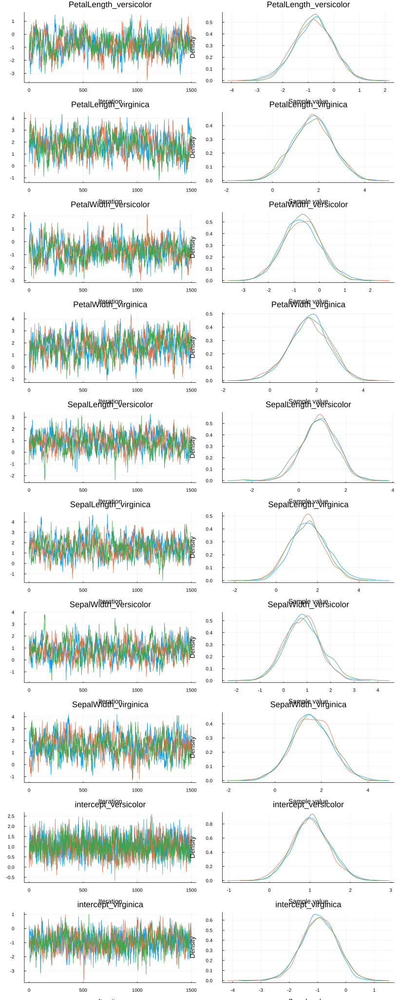

In [8]:
plot(chain)

Looks good!

We can also use the `corner` function from MCMCChains to show the distributions of the various parameters of our multinomial logistic regression. The corner function requires MCMCChains and StatsPlots.

In [9]:
corner(chain, [:SepalLength_versicolor, :SepalWidth_versicolor, :PetalLength_versicolor, :PetalWidth_versicolor])

In [10]:
corner(chain, [:SepalLength_versicolor, :SepalWidth_versicolor, :PetalLength_versicolor, :PetalWidth_versicolor])

Fortunately the corner plots appear to demonstrate unimodal distributions for each of our parameters, so it should be straightforward to take the means of each parameter's sampled values to estimate our model to make predictions.

## Making Predictions
How do we test how well the model actually predicts whether someone is likely to default? We need to build a prediction function that takes the `test` object we made earlier and runs it through the average parameter calculated during sampling.

The `prediction` function below takes a `Matrix` and a `Chain` object. It takes the mean of each parameter's sampled values and re-runs the softmax function using those mean values for every element in the test set.

In [11]:
function prediction(x::Matrix, chain)
    # Pull the means from each parameter's sampled values in the chain.
    intercept_versicolor = mean(chain[:intercept_versicolor].value)
    intercept_virginica = mean(chain[:intercept_virginica].value)
    SepalLength_versicolor = mean(chain[:SepalLength_versicolor].value)
    SepalLength_virginica = mean(chain[:SepalLength_virginica].value)
    SepalWidth_versicolor = mean(chain[:SepalWidth_versicolor].value)
    SepalWidth_virginica = mean(chain[:SepalWidth_virginica].value)
    PetalLength_versicolor = mean(chain[:PetalLength_versicolor].value)
    PetalLength_virginica = mean(chain[:PetalLength_virginica].value)
    PetalWidth_versicolor = mean(chain[:PetalWidth_versicolor].value)
    PetalWidth_virginica = mean(chain[:PetalWidth_virginica].value)

    # Retrieve the number of rows.
    n, _ = size(x)

    # Generate a vector to store our predictions.
    v = Vector{String}(undef, n)

    # Calculate the softmax function for each element in the test set.
    for i in 1:n
        num = softmax([0, # this 0 corresponds to the base category `setosa`
                     intercept_versicolor + SepalLength_versicolor*x[i, 1] +
                                            SepalWidth_versicolor*x[i, 1] +
                                            PetalLength_versicolor*x[i, 2] +
                                            PetalWidth_versicolor*x[i, 2],
                     intercept_virginica + SepalLength_virginica*x[i, 3] +
                                           SepalWidth_virginica*x[i, 3] +
                                           PetalLength_virginica*x[i, 4] +
                                           PetalWidth_virginica*x[i, 4]])
        c = argmax(num) # we pick the class with the highest probability
        if c == 1
            v[i] = "setosa"
        elseif c == 2
            v[i] = "versicolor"
        else # c == 3
            @assert c == 3
            v[i] = "virginica"
        end
    end
    return v
end;

Let's see how we did! We run the test matrix through the prediction function, and compute the accuracy for our prediction.

In [12]:
# Make the predictions.
predictions = prediction(test_features, chain)

# Calculate accuracy for our test set.
mean(predictions .== test[!, :Species])

0.8933333333333333

Perhaps more important is to see the accuracy per class.

In [13]:
setosa_rows = test[!, :Species] .== "setosa"
versicolor_rows = test[!, :Species] .== "versicolor"
virginica_rows = test[!, :Species] .== "virginica"

println("Number of setosa: $(sum(setosa_rows))")
println("Number of versicolor: $(sum(versicolor_rows))")
println("Number of virginica: $(sum(virginica_rows))")

println("Percentage of setosa predicted correctly: $(mean(predictions[setosa_rows] .== test[setosa_rows, :Species]))")
println("Percentage of versicolor predicted correctly: $(mean(predictions[versicolor_rows] .== test[versicolor_rows, :Species]))")
println("Percentage of virginica predicted correctly: $(mean(predictions[virginica_rows] .== test[virginica_rows, :Species]))")

Number of setosa: 32
Number of versicolor: 25
Number of virginica: 18
Percentage of setosa predicted correctly: 0.96875
Percentage of versicolor predicted correctly: 0.76
Percentage of virginica predicted correctly: 0.9444444444444444


This tutorial has demonstrated how to use Turing to perform Bayesian multinomial logistic regression. 